<a href="https://colab.research.google.com/github/muhammad25b/End-to-End-Dog-Breed-Classification-/blob/main/Dog_Breed_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-End  Multi Class Dog Breed Classification.

## 1. Problem:
Identify breed of dog given an image of dog.
## 2. Data
Data we're using is from Kaggle Dog Breed Identification Competition.
## 3. Evaluation
Evaluation is a file with prediction probabilities for each dog breed of each test image.
## 4. Features
Some information about data:
- We're dealing with images (unstructured data).
- There are 120 breeds of dogs, it is multi class classification so we have 120 classes.
- 10222 images in train set (have labels).
- 10222 images in test set (no labels, we'll predict).



### Getting our Workspace Ready.

- Import TensorFlow
- Import TensorFlowHub
- Make sure we're using GPU

In [21]:
#import necessary tools.
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow Version: ",tf.__version__)
print("TensorFlowHub Version: ",hub.__version__)

# GPU Checking
print("GPU Available!" if tf.config.list_physical_devices("GPU") else "GPU not available")


TensorFlow Version:  2.8.2
TensorFlowHub Version:  0.12.0
GPU Available!


## 1. Getting our Data Ready.

We will turn our data into Tensors. With all ML Models, our data has to be in the numerical format. Tensors is a fancy name for numpy array/matrix.

### 1.1 Lodaing our Data Labels 
Let's start by accessing our data and checking labels.


In [28]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog-vision/labels.csv")
labels_csv.describe(),labels_csv.head()

(                                      id               breed
 count                              10222               10222
 unique                             10222                 120
 top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
 freq                                   1                 126,
                                  id             breed
 0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
 1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
 2  001cdf01b096e06d78e9e5112d419397          pekinese
 3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
 4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever)

In [29]:
# How many images are there of each breed.
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

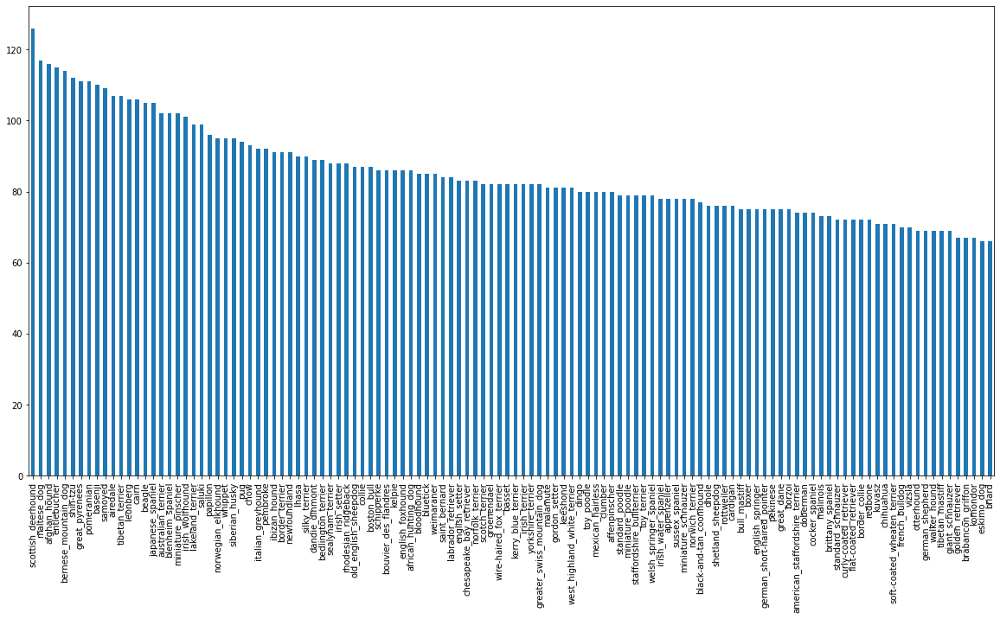

In [30]:
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))

In [31]:
labels_csv["breed"].value_counts().median()

82.0

So, we can say there are 82 images per class.

### 1.2 Preparing Images

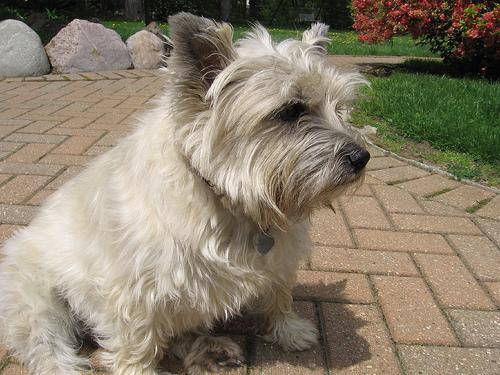

In [6]:
from IPython.display import Image
Image("drive/MyDrive/Dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg")

### 1.3 Getting Images and their Labels.
We will list all of our images and their paths in a list.

In [32]:
#create pathnames from image IDs
filenames = ["drive/MyDrive/Dog-vision/train/"+fname+".jpg" for fname in labels_csv['id']]

#check first 10
filenames[:10]

['drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

Check whether number of file paths in `filenames` equals actual files in train set.

In [8]:
import os
if len(os.listdir("drive/MyDrive/Dog-vision/train/")) == len(filenames):
    print("Filenames match actual number of images")
else:
    print("Filenames DONOT match actual number of images")

Filenames match actual number of images


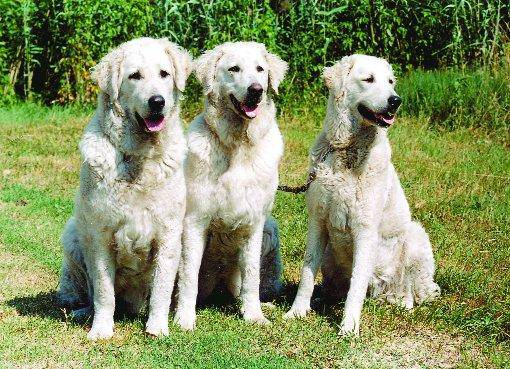

In [9]:
Image(filenames[400])

In [33]:
labels_csv["breed"][400]

'kuvasz'

### 1.4 Preparing Labels
Since we have got training image paths in list. let's prepare our labels.

In [34]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
len(labels)

10222

In [13]:
if len(labels) == len(filenames):
    print("No of labels match of no of images")
else:
    print("Check file directories, we have some missing values")

No of labels match of no of images


As no of labels match == len of filenames so no labels are missing.

In [35]:
# let's find unique dog breeds
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [15]:
len(unique_breeds)

120

In [16]:
# Turn a single label to an array of boolean values.
print(labels[0])
labels[0] == unique_breeds


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [11]:
# Do this for every labels 
boolean_labels  = [label == unique_breeds for label in labels]

In [18]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [12]:
#converting our labels to numbers.
print(labels[0]) # Actual Label
print(np.where(unique_breeds == labels[0])) #index where label matches unique labels
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be one where label occurs in boolean array.

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


As it was True at 19th index so it is marked 1 and rest are 0s

### 1.5 Creating our Validation Set.



In [13]:
X = filenames
y = boolean_labels

We won't be able to train all at once so we will train only 1000 images and increase gradually.

In [14]:
NUM_IMAGES = 1000 #@param{type:"slider",min:1000,max:10222}

In [15]:
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size = 0.2,
                                               random_state=92)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [24]:
X_train[90],y_train[90]

('drive/MyDrive/Dog-vision/train/17c5e8815cf0d086090a07b003b9b036.jpg',
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
         True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
     

### 1.6 Preprossing images(Turning imags to Tensors)

For this we will write a function which will do following.

1. Take an image filepath as input.
2. Use Tensorflow to read file and save it to variable `image`
3. Turn our `image` (a jpg) into Tensors.
4. Resize image to shape (226,226).
5. Return the modified image.

In [40]:
# how images look like in arrays
from matplotlib.pyplot import imread
image = imread(filenames[83])
image.shape

(350, 500, 3)

In [26]:
image

array([[[134, 126,  79],
        [136, 128,  81],
        [140, 132,  85],
        ...,
        [139, 137,  80],
        [135, 133,  76],
        [134, 132,  75]],

       [[139, 131,  84],
        [140, 132,  85],
        [142, 134,  87],
        ...,
        [133, 130,  75],
        [127, 124,  69],
        [125, 122,  67]],

       [[146, 138,  91],
        [145, 137,  90],
        [145, 137,  90],
        ...,
        [127, 124,  69],
        [122, 119,  64],
        [119, 116,  61]],

       ...,

       [[102, 101,  47],
        [105, 104,  50],
        [110, 109,  55],
        ...,
        [140, 136,  89],
        [142, 138,  91],
        [136, 132,  85]],

       [[ 94,  93,  39],
        [101, 100,  46],
        [108, 107,  53],
        ...,
        [143, 139,  92],
        [146, 142,  95],
        [144, 140,  93]],

       [[ 99,  96,  43],
        [109, 106,  53],
        [116, 113,  58],
        ...,
        [151, 147,  99],
        [152, 148, 100],
        [152, 148, 100]]

In [27]:
np.unique(image)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [28]:
#turning images into tensors
tf.constant(image)

<tf.Tensor: shape=(350, 500, 3), dtype=uint8, numpy=
array([[[134, 126,  79],
        [136, 128,  81],
        [140, 132,  85],
        ...,
        [139, 137,  80],
        [135, 133,  76],
        [134, 132,  75]],

       [[139, 131,  84],
        [140, 132,  85],
        [142, 134,  87],
        ...,
        [133, 130,  75],
        [127, 124,  69],
        [125, 122,  67]],

       [[146, 138,  91],
        [145, 137,  90],
        [145, 137,  90],
        ...,
        [127, 124,  69],
        [122, 119,  64],
        [119, 116,  61]],

       ...,

       [[102, 101,  47],
        [105, 104,  50],
        [110, 109,  55],
        ...,
        [140, 136,  89],
        [142, 138,  91],
        [136, 132,  85]],

       [[ 94,  93,  39],
        [101, 100,  46],
        [108, 107,  53],
        ...,
        [143, 139,  92],
        [146, 142,  95],
        [144, 140,  93]],

       [[ 99,  96,  43],
        [109, 106,  53],
        [116, 113,  58],
        ...,
        [151, 147,  9


1. Take an image filepath as input.
2. Use Tensorflow to read file and save it to variable `image`
3. Turn our `image` (a jpg) into Tensors.
4. Normalize Images; convert values from 0-255 to 0-1.
5. Resize image to shape (224,224).
6. Return the modified image.

In [1]:
# defining the image size
IMG_SIZE = 224

#defining the function
def process_image(image_path,img_size = IMG_SIZE):
    """
    Takes an image file and turn the image into Tensors.
    """

    #read the image file
    image = tf.io.read_file(image_path)
    
    #Turn the jpg image into numerical tensor with 3 color channels (RGB)
    image = tf.image.decode_jpeg(image,channels =3)

    #convert the color channel value from (0 to 255) to (0 to 1) values
    image = tf.image.convert_image_dtype(image,tf.float32)

    #resize the images to (224,224)
    image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
    
    #return the image
    return image

### 1.7 Turning our Data into batches

Why to turn data into batches?

Ans. Working with 32 images is easier than working with 1000s of images. They all might not fit in memory.

Default batch size in 32.

In order to use TensorFlow effectively our data should be in tensor tuples. `(image,label)`


In [2]:
# create a simple function to return tensor tuple (image,label)

def get_image_label(image_path,label):
    """
    Takes an image path and associated label and returns them in tuple.
    """
    image = process_image(image_path)
    return image,label


In [16]:
#demo of above fucntion

(process_image(X[83]),tf.constant(y[83]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5277377 , 0.50420827, 0.31597295],
         [0.56522346, 0.54169405, 0.35345873],
         [0.60466015, 0.58113074, 0.39289546],
         ...,
         [0.58160233, 0.56591606, 0.3776808 ],
         [0.5487996 , 0.53763014, 0.32075328],
         [0.5169227 , 0.5090796 , 0.28555015]],
 
        [[0.55899096, 0.53546154, 0.34722626],
         [0.5732734 , 0.549744  , 0.36150867],
         [0.6153077 , 0.5917783 , 0.40354303],
         ...,
         [0.52304906, 0.5073628 , 0.31912744],
         [0.51492786, 0.5032562 , 0.292997  ],
         [0.4739046 , 0.46275264, 0.24584086]],
 
        [[0.5784336 , 0.55490416, 0.36666888],
         [0.60142136, 0.57789195, 0.38965666],
         [0.62693894, 0.6034095 , 0.41517422],
         ...,
         [0.5120436 , 0.49635732, 0.308122  ],
         [0.46862862, 0.4568639 , 0.2510165 ],
         [0.48467603, 0.47291133, 0.26524314]],
 
        ...,
 
        [[0.4510822 , 0.462128  

Now we've got a way to turn our data into tuples of tensors in the form `(image,label)`. Let's write a function to turn all of our data X and y into batches.

### 1.8 Turning our data into Batches.

In [3]:
# define batch size
BATCH_SIZE = 32

#define function for to turn our data into batches.

def create_data_batches(X, y=None, size= BATCH_SIZE, valid_data = False, test_data = False):
    """
    Creates batches of data out of image (X) and label (y).
    Shuffles data if it is training data.
    Does not shuffle if it is validation data.
    Also accepts test data as input, (no labels)
    """
    # if data is test data, we probably don't have labels
    if test_data:
        print("Creating Test Data Batches.")
        data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) #only filepaths, no labels
        data_batch = data.map(process_image).batch(BATCH_SIZE) 
        return data_batch
    
    # if the data is a valid dataset so we don't need to shuffle it.
    elif valid_data:
        print("Creating Batches of Validation set")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  #filpaths
                                                   tf.constant(y))) #labels
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch
    
    else:
        print("Creating Training Data Batches")
        # Turn  filepaths  and labels in Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  #filpaths
                                                   tf.constant(y))) #labels
        # shuffling pathnames and labels before mapping image processor function is faster than shuffling images.
        data = data.shuffle(buffer_size = len(X))

        #create (image,label) tuple, this also turns the image path into preprocessed image
        data = data.map(get_image_label)
        data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [20]:
#creating training and validation batches
train_data= create_data_batches(X_train,y_train)
valid_data = create_data_batches(X_val,y_val,valid_data=True)

Creating Training Data Batches
Creating Batches of Validation set


In [19]:
# Check Diff attributes of our data batches.
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### 1.8 Visualizing our Data.
it's hard to understand data at this point, so we'll visualize it.



In [41]:
import matplotlib.pyplot as plt

#create a function to view a databatch
def view_batch(images,labels):
    """
    Displays a plot of a image and their labels in a batch
    """

    # setup a figure
    plt.figure(figsize=(16,20))

    # Loop through all images of a batch.
    for i in range(32): #our batch size is of 32
        #create subplots
        ax = plt.subplot(4,8,i+1)
        # Display an image
        plt.imshow(images[i])

        #Add the image lable title.
        plt.title(unique_breeds[labels[i].argmax()])

        #turn the gridlines off
        plt.axis("off")


In [36]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [22]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[0.57365197, 0.5305147 , 0.56188726],
          [0.53965604, 0.4965188 , 0.52789134],
          [0.5221971 , 0.47905985, 0.5104324 ],
          ...,
          [0.6767759 , 0.59442294, 0.58265823],
          [0.643054  , 0.5607011 , 0.54893637],
          [0.5772296 , 0.4948767 , 0.483112  ]],
 
         [[0.51944786, 0.47631064, 0.50768316],
          [0.5418487 , 0.49871147, 0.530084  ],
          [0.5880922 , 0.54495496, 0.5763275 ],
          ...,
          [0.6492998 , 0.56694686, 0.55518216],
          [0.59417075, 0.5118178 , 0.50005305],
          [0.61057955, 0.5282266 , 0.5164619 ]],
 
         [[0.5587262 , 0.51558894, 0.5469615 ],
          [0.50649095, 0.46335366, 0.49472624],
          [0.5589935 , 0.51585627, 0.5472288 ],
          ...,
          [0.5822951 , 0.49994218, 0.48817748],
          [0.69717115, 0.6148182 , 0.6030535 ],
          [0.78282225, 0.7004693 , 0.6887046 ]],
 
         ...,
 
         [[0.30739775, 0.32308403, 0.36051413],
          [0.33642

In [38]:
len(train_images), len(train_labels)

(32, 32)

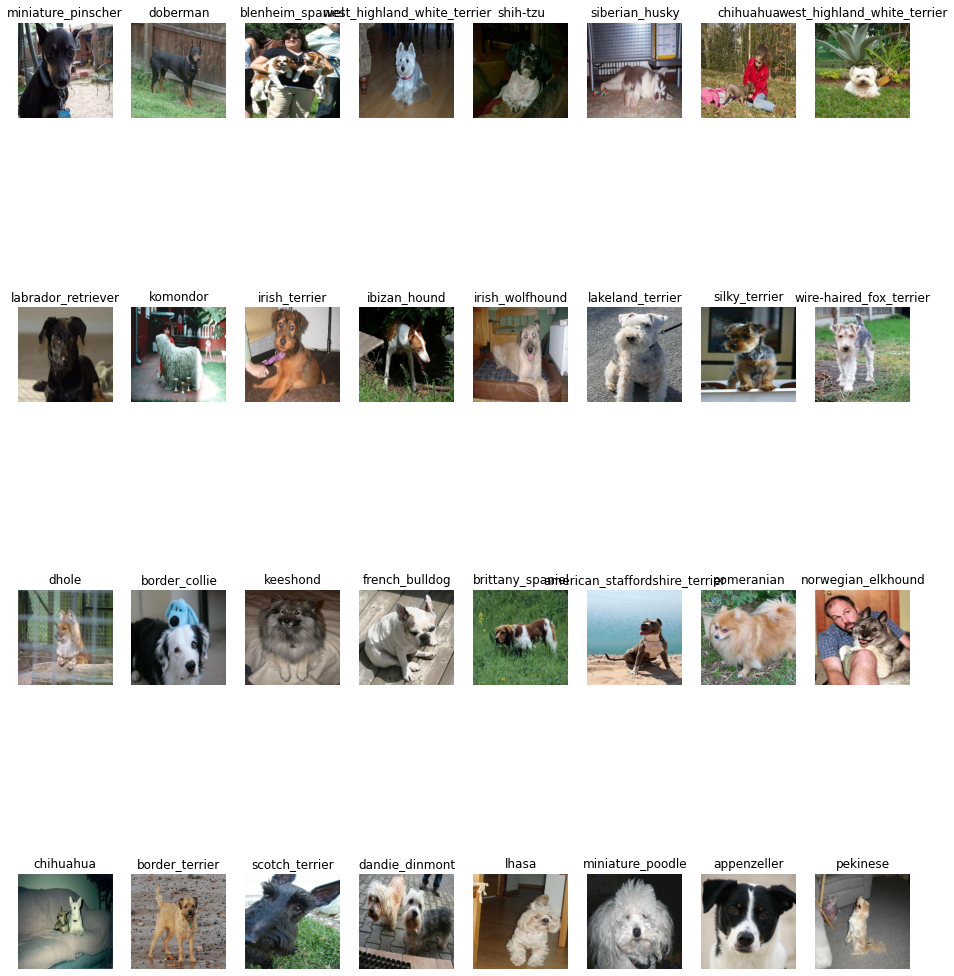

In [39]:
# Let's visualize the data in training batch
view_batch(train_images,train_labels)

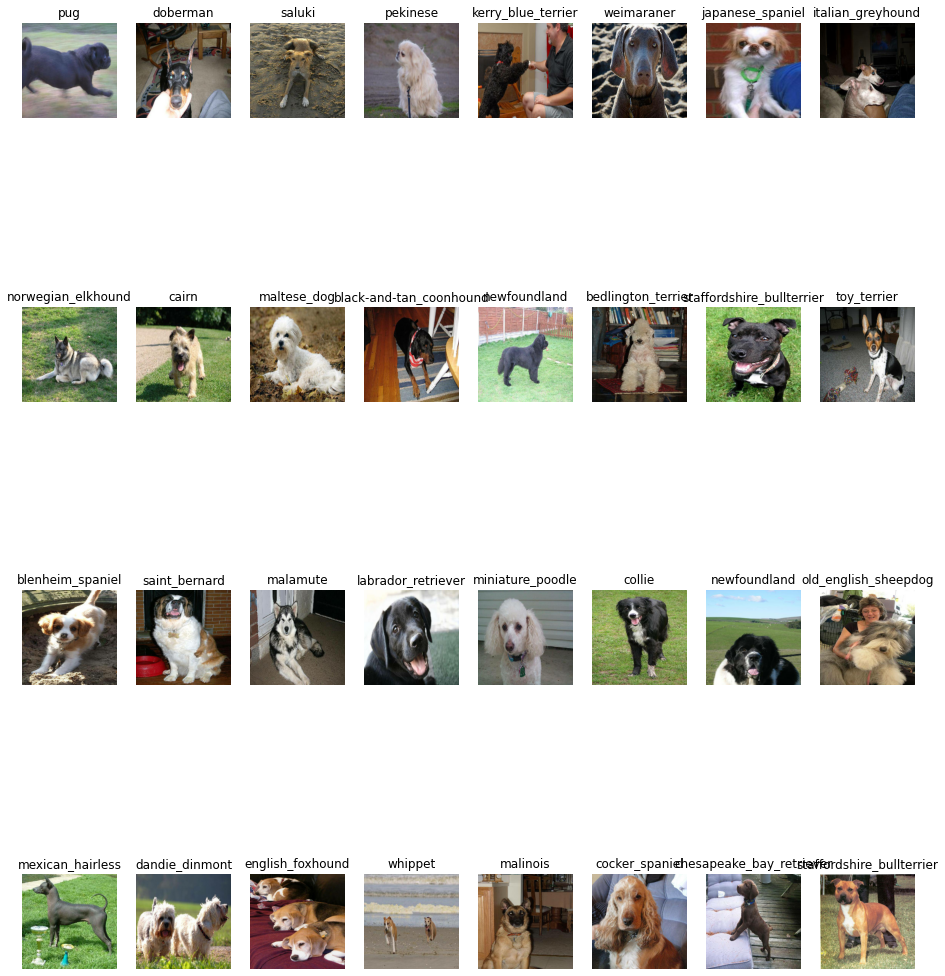

In [23]:
# let's visualize val batch
val_images,val_labels = next(valid_data.as_numpy_iterator())
view_batch(val_images,val_labels)

## 2. Builiding A Model

Before we build a model there are few things we have to define:
1. The input Shape(our images shape, in the form of Tensors) to our model.
2. The output Shape(our labels shape, in the form of Tensors) of our model. 
3.  The URL of our model we want to use.

In [24]:
# setup an input shape to the model.
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, widht, color channel

#setup output shape of our model.
OUTPUT_SHAPE = len(unique_breeds)

# Setup URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our input, outputs and model. Let's put them in Keras Deep Learning Model.

Now, Let's create a function:
* Takes an input shape, output shape and model we have chosen as input parameters.
* Defines the layer in keras Model in sequential Fashion (Do this first, then this and then that... in a linear step by step way).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model(tells the model, the input shape it will be getting).
* Returns the model.

In [25]:
# create a function to build Keras Model

def create_model(input_shape = INPUT_SHAPE, output_sahpe = OUTPUT_SHAPE, url = MODEL_URL):
    print("Building Model with: ",MODEL_URL)

    #setup the model layers
    model = tf.keras.Sequential([
                                hub.KerasLayer(MODEL_URL), # Layer 1 -> Input layer
                                tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                                                      activation = "softmax") # Layer 2 -> Output Layer
    ])

    #compile the model
    model.compile(
        loss = tf.keras.losses.CategoricalCrossentropy(),
        optimizer = tf.keras.optimizers.Adam(),
        metrics = ["accuracy"]
    )

    # Build the model
    model.build(INPUT_SHAPE)

    return model

In [26]:
model = create_model()
model.summary()

Building Model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## 3. Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.



### 3.1 TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension 
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. 
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [27]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [28]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### 3.2 Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [29]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## 4. Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [30]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [48]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [31]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [50]:
# Fit the model to the data
model = train_model()

Building Model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 117s 3s/step - loss: 4.6154 - accuracy: 0.1138 - val_loss: 3.4074 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 3s 126ms/step - loss: 1.6816 - accuracy: 0.6900 - val_loss: 2.1130 - val_accuracy: 0.4550
Epoch 3/100
25/25 [==============================] - 3s 123ms/step - loss: 0.5663 - accuracy: 0.9463 - val_loss: 1.6592 - val_accuracy: 0.5350
Epoch 4/100
25/25 [==============================] - 3s 123ms/step - loss: 0.2515 - accuracy: 0.9912 - val_loss: 1.4815 - val_accuracy: 0.5750
Epoch 5/100
25/25 [==============================] - 3s 126ms/step - loss: 0.1443 - accuracy: 0.9987 - val_loss: 1.4137 - val_accuracy: 0.5800
Epoch 6/100
25/25 [==============================] - 3s 126ms/step - loss: 0.0976 - accuracy: 1.0000 - val_loss: 1.3654 - val_accuracy: 0.6100
Epoch 7/100
25/25 [==============================

**Question** It looks like that our model is overfitting because it is performing far better than train data then validation data. What are some ways to prevent model overfitting in deep learning Nerual Networks?

**Note** Overfitting to begin with is a good thing! It means our model is learning.

### 4.1 Checking Tensoroard logs.

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [51]:
%tensorboard --logdir drive/MyDrive/Dog-vision/logs

<IPython.core.display.Javascript object>

## 5. Making Prediction using Our Trained Model

In [52]:
predictions = model.predict(valid_data, verbose = 1)

7/7 [==============================] - 1s 105ms/step


In [53]:
predictions

array([[2.2857031e-02, 4.5690676e-03, 4.5849718e-03, ..., 2.2591606e-03,
        4.1362148e-04, 1.5287411e-04],
       [4.5228193e-05, 7.0830993e-04, 7.5040845e-04, ..., 1.9695174e-03,
        2.5673659e-04, 8.4286206e-04],
       [1.3127546e-06, 7.8420984e-05, 2.4589375e-04, ..., 2.6162326e-01,
        4.6248487e-04, 1.8368740e-04],
       ...,
       [4.6634250e-03, 1.6170750e-04, 6.1936909e-05, ..., 6.1828257e-05,
        5.1412153e-06, 4.5279063e-05],
       [1.4014479e-03, 1.6197962e-03, 4.6740548e-05, ..., 3.2667533e-01,
        1.8223404e-03, 3.0849295e-04],
       [3.0719978e-04, 3.5357568e-03, 3.4058344e-04, ..., 3.7570659e-04,
        1.4185120e-03, 2.1207189e-02]], dtype=float32)

In [54]:
np.sum(predictions[1])

1.0

In [55]:
predictions.shape

(200, 120)

In [56]:
predictions[1]

array([4.5228193e-05, 7.0830993e-04, 7.5040845e-04, 4.9225097e-03,
       4.2511281e-04, 2.7487528e-02, 2.4723838e-04, 4.2219032e-03,
       7.8295539e-05, 3.1431376e-03, 7.0757436e-04, 3.9167691e-04,
       1.3672562e-02, 8.0864952e-04, 5.4899772e-04, 1.3618752e-02,
       4.7549486e-04, 4.6406954e-04, 6.1398692e-04, 1.3975044e-04,
       6.6606066e-04, 6.1856763e-04, 5.7529254e-05, 2.5603632e-04,
       1.9199787e-04, 3.9842585e-04, 1.6102358e-05, 1.0284038e-03,
       5.1096728e-04, 1.0680177e-04, 1.7985892e-04, 1.0573260e-04,
       5.0343464e-05, 4.6534700e-05, 1.6392819e-03, 3.7013513e-05,
       9.8425218e-05, 1.6512347e-03, 7.6764846e-01, 7.5307929e-05,
       1.7099899e-04, 1.9097903e-04, 1.8214782e-03, 3.0275120e-04,
       1.0656482e-03, 1.2565184e-04, 4.2539607e-03, 7.0394721e-04,
       2.3610824e-04, 1.6118452e-04, 3.0451624e-03, 5.3380318e-03,
       3.9116698e-03, 6.6733896e-04, 1.3606056e-03, 3.1385161e-03,
       4.1027192e-04, 8.6284342e-04, 1.8284764e-04, 4.0453268e

In [57]:
# First Prediction
index = 0
print(predictions[index])
print(f"Max value of (probability) Prediction is : {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Prdicted Label: {unique_breeds[np.argmax(predictions[index])]}")


[2.28570309e-02 4.56906762e-03 4.58497182e-03 1.54066738e-03
 3.92546970e-03 6.08736766e-04 3.66730569e-03 4.55917529e-04
 1.51747605e-03 1.27554114e-03 5.77697101e-05 5.45274839e-03
 2.65838299e-03 9.02833825e-04 2.49543739e-03 1.56102920e-04
 2.81277485e-03 5.30448370e-03 2.41784306e-04 3.69743514e-03
 6.13982342e-02 1.25080615e-03 1.45218568e-02 5.72902733e-04
 3.61642742e-04 1.75338835e-02 5.18623507e-04 9.81651479e-04
 1.93047896e-02 4.52035712e-03 1.46879419e-03 4.80070943e-03
 5.34133054e-03 8.02467228e-04 2.93860561e-03 1.75230764e-03
 1.43379846e-03 2.82045861e-04 3.08623712e-04 1.08378234e-04
 4.98751062e-04 2.28814752e-04 9.06792819e-04 2.57339724e-03
 3.16899084e-02 6.84472825e-03 3.55231180e-03 3.71920923e-03
 9.25495941e-03 2.61459034e-03 1.09556969e-02 4.43152711e-03
 1.28147816e-02 1.99270621e-03 3.50227742e-03 1.26210129e-04
 4.51551896e-04 2.50623282e-03 1.67403498e-03 1.45993475e-03
 3.56863718e-04 1.62389409e-03 1.54211384e-03 1.40786162e-02
 2.28865712e-04 1.895859

In [58]:
# Second Prediction
index = 1
print(predictions[index])
print(f"Max value of (probability) Prediction is : {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Prdicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[4.5228193e-05 7.0830993e-04 7.5040845e-04 4.9225097e-03 4.2511281e-04
 2.7487528e-02 2.4723838e-04 4.2219032e-03 7.8295539e-05 3.1431376e-03
 7.0757436e-04 3.9167691e-04 1.3672562e-02 8.0864952e-04 5.4899772e-04
 1.3618752e-02 4.7549486e-04 4.6406954e-04 6.1398692e-04 1.3975044e-04
 6.6606066e-04 6.1856763e-04 5.7529254e-05 2.5603632e-04 1.9199787e-04
 3.9842585e-04 1.6102358e-05 1.0284038e-03 5.1096728e-04 1.0680177e-04
 1.7985892e-04 1.0573260e-04 5.0343464e-05 4.6534700e-05 1.6392819e-03
 3.7013513e-05 9.8425218e-05 1.6512347e-03 7.6764846e-01 7.5307929e-05
 1.7099899e-04 1.9097903e-04 1.8214782e-03 3.0275120e-04 1.0656482e-03
 1.2565184e-04 4.2539607e-03 7.0394721e-04 2.3610824e-04 1.6118452e-04
 3.0451624e-03 5.3380318e-03 3.9116698e-03 6.6733896e-04 1.3606056e-03
 3.1385161e-03 4.1027192e-04 8.6284342e-04 1.8284764e-04 4.0453268e-04
 8.6373744e-05 8.6617663e-05 2.5509406e-04 2.6165452e-03 5.1558414e-04
 3.3096108e-04 7.6950091e-04 1.3915570e-02 1.1848578e-03 4.4258417e-05
 1.488

In [59]:
# random Prediction
index = 32
print(predictions[index])
print(f"Max value of (probability) Prediction is : {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Prdicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[5.2930005e-07 1.3566005e-05 1.9964864e-07 1.0682550e-05 3.3815300e-05
 1.4298513e-05 7.3663379e-08 1.4068991e-04 1.0668062e-05 1.0640359e-04
 3.0462908e-07 1.7062569e-06 1.9736474e-06 4.3596688e-06 3.4288179e-05
 2.1560923e-06 1.9418094e-06 8.9412853e-05 5.3214435e-06 3.6311091e-04
 1.7059494e-04 3.2878804e-03 8.5109401e-05 4.8427023e-06 6.6071939e-06
 9.9074990e-01 4.0648251e-06 3.1138330e-07 2.2004895e-05 1.5016514e-05
 7.4928244e-06 1.0677610e-05 3.7908646e-06 3.8481298e-07 8.2852230e-06
 1.7312217e-06 2.6904622e-06 2.2405534e-06 3.9774532e-05 3.6624162e-05
 3.3662014e-05 2.0906920e-07 2.1027134e-05 5.8241476e-06 8.4102325e-08
 6.5650893e-05 6.3358689e-06 3.2102791e-05 1.1337535e-05 1.3733393e-07
 3.8490348e-06 9.0302012e-05 1.9335382e-06 1.1466547e-04 5.7958869e-07
 9.8663540e-06 8.3116510e-07 1.1915631e-05 4.7955718e-06 2.4099440e-06
 1.9949390e-05 1.8122566e-05 1.0738499e-04 1.8007541e-06 5.6770909e-06
 2.8367176e-06 7.0723013e-07 2.7283713e-05 1.0668259e-06 1.0508857e-04
 8.072

Having  the above functionality is great but we want to be able to see it at scale.

And it would be even better if we could see the image the prediction being made on.

**Note** Prediction probabilities are also called as confidence levels.

In [7]:
# Turn prediction probs to respective labels.
def get_pred_label(prediction_probabilites):
    """
    Turn an array of predicted probs into labels
    """
    return unique_breeds[np.argmax(prediction_probabilites)]

#Get a predicted Label based on array of prediction probabilites.
pred_label = get_pred_label(predictions[0])

In [61]:
pred_label

'tibetan_mastiff'

In [62]:
get_pred_label(predictions[69])

'norwich_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [8]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
    """
    Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
    of images and labels.
    """
    images = []
    labels = []
    # Loop through unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])
    return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(valid_data)
val_images[0], val_labels[0]

Now we've got the way to get 
* Prediction Labels
* Validaton Labels (Truth labels)
* Validation Images

Let's make a function to visualize them

We'll create a function which will take
* An array of Prediction Probabilites
* An array of truth Labels
* An array of images and
* An Integer

and will Plot
* Predicted label
* its Predicted Probability
* the truth label
* and target image 
on a single plot.

In [35]:
def plot_pred(prediction_probabilities, labels, images, n =1):
    """
    View prediction, ground truth and image for sample n
    """
    pred_prob , true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get pred label
    pred_label = get_pred_label(pred_prob)

    #Plot Image and Remove Ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change color of title depending on right and wrong prediction
    if pred_label == true_label:
        color = "green"
    else: color = "red"

    # Change plot title to predicted label probability of prediction and truth
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color = color)
    

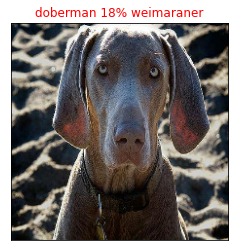

In [65]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n = 5)

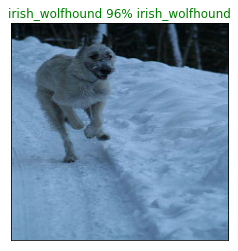

In [67]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n = 45)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

Take an input of prediction probabilities array and a ground truth array and an integer ✅
Find the prediction using get_pred_label() ✅
Find the top 10:
Prediction probabilities indexes ✅
Prediction probabilities values ✅
Prediction labels ✅
Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [36]:
def plot_pred_conf(prediction_probabilities, labels, n=1 ):
    """
    Plus the Top 10 prediction confidences along with the truth label for sample n
    """
    pred_prob, true_label, = prediction_probabilities[n],labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidences index
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup Plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color = "grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
    
    # Change the color of true label
    if np.isin(true_label,top_10_pred_labels): 
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else: pass



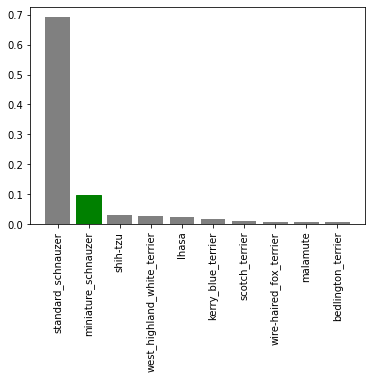

In [69]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 92)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

NameError: ignored

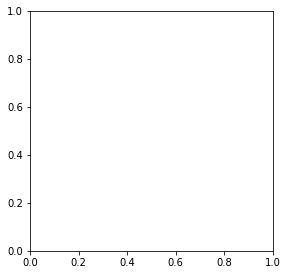

In [37]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize = (10*num_cols,5*num_rows))

for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities = predictions,
              labels = val_labels,
              images = val_images,
              n = i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities = predictions,
                   labels = val_labels,
                   n = i+i_multiplier)

plt.tight_layout()
plt.show()

**Challenge:  **
Create a confusion matrix.

In [71]:
pred_labels = []
for i in range(len(predictions)):
    pred_labels.append(get_pred_label(predictions[i]))

pred_labels = np.array(pred_labels)
pred_labels

array(['tibetan_mastiff', 'doberman', 'saluki', 'pekinese',
       'kerry_blue_terrier', 'doberman', 'japanese_spaniel',
       'italian_greyhound', 'norwegian_elkhound', 'border_terrier',
       'maltese_dog', 'doberman', 'afghan_hound', 'bedlington_terrier',
       'staffordshire_bullterrier', 'basenji', 'blenheim_spaniel',
       'saint_bernard', 'malamute', 'labrador_retriever', 'toy_poodle',
       'border_collie', 'border_collie', 'old_english_sheepdog',
       'whippet', 'dandie_dinmont', 'beagle', 'saluki', 'malinois',
       'welsh_springer_spaniel', 'chesapeake_bay_retriever',
       'staffordshire_bullterrier', 'bull_mastiff', 'golden_retriever',
       'mexican_hairless', 'flat-coated_retriever', 'clumber',
       'weimaraner', 'english_springer', 'greater_swiss_mountain_dog',
       'bloodhound', 'irish_wolfhound', 'cardigan',
       'welsh_springer_spaniel', 'basenji', 'irish_wolfhound',
       'rhodesian_ridgeback', 'welsh_springer_spaniel',
       'bedlington_terrier', 

In [72]:
type(unique_breeds), type(pred_labels)

(numpy.ndarray, numpy.ndarray)

In [73]:

# Import label encoder
from sklearn import preprocessing

# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()

# Encode labels in column 'species'.
encoded_preds= label_encoder.fit_transform(pred_labels)
encoded_labels = label_encoder.fit_transform(val_labels)


In [74]:
encoded_preds, encoded_labels

(array([84, 30, 75, 68, 51, 30, 49, 48, 63, 14, 57, 30,  0,  8, 82,  5, 10,
        74, 55, 52, 86, 13, 13, 65, 92, 27,  7, 75, 56, 90, 22, 82, 20, 39,
        58, 35, 25, 89, 32, 41, 11, 47, 21, 90,  5, 47, 73, 90,  8,  5, 26,
         9, 22, 85,  8, 12,  1,  2, 43, 80, 62, 33, 45,  7, 75, 72, 47, 29,
        77, 64, 87, 45,  3, 59,  7, 25, 15, 23, 90, 78, 83,  4, 86, 72, 52,
        66, 69, 81, 71, 80, 47, 29, 83, 84, 29, 72, 11, 34, 27, 60, 88, 57,
        15, 11, 16, 61, 67, 33, 40, 24,  4, 80, 35, 41, 11, 39, 51, 54, 83,
        39, 76, 65, 23, 65, 38, 44, 47, 16, 52, 88, 62,  9, 76,  0, 18, 46,
        53, 75, 31, 92,  4, 45, 86, 93, 48, 69, 10, 37, 70, 19, 54, 92, 11,
        81, 79, 59, 63, 91, 52, 92, 49,  8, 35, 36, 49, 82, 28,  6, 31, 22,
        82, 17, 42,  2,  5, 78, 90,  5, 14, 55, 75,  6, 82, 50, 90, 19, 38,
        85, 30,  1, 27, 19, 66, 91, 67, 70, 55, 77, 92, 67]),
 array([76, 34, 79, 73, 55, 95, 54, 53, 68, 23, 61, 11, 66,  9, 87, 92, 12,
        78, 59, 56, 64, 30

In [75]:
pred_labels, val_labels

(array(['tibetan_mastiff', 'doberman', 'saluki', 'pekinese',
        'kerry_blue_terrier', 'doberman', 'japanese_spaniel',
        'italian_greyhound', 'norwegian_elkhound', 'border_terrier',
        'maltese_dog', 'doberman', 'afghan_hound', 'bedlington_terrier',
        'staffordshire_bullterrier', 'basenji', 'blenheim_spaniel',
        'saint_bernard', 'malamute', 'labrador_retriever', 'toy_poodle',
        'border_collie', 'border_collie', 'old_english_sheepdog',
        'whippet', 'dandie_dinmont', 'beagle', 'saluki', 'malinois',
        'welsh_springer_spaniel', 'chesapeake_bay_retriever',
        'staffordshire_bullterrier', 'bull_mastiff', 'golden_retriever',
        'mexican_hairless', 'flat-coated_retriever', 'clumber',
        'weimaraner', 'english_springer', 'greater_swiss_mountain_dog',
        'bloodhound', 'irish_wolfhound', 'cardigan',
        'welsh_springer_spaniel', 'basenji', 'irish_wolfhound',
        'rhodesian_ridgeback', 'welsh_springer_spaniel',
        'bedli

In [76]:
confusion = tf.math.confusion_matrix(labels= encoded_labels, predictions=encoded_preds, num_classes=len(unique_breeds))
confusion

<tf.Tensor: shape=(120, 120), dtype=int32, numpy=
array([[0, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [0, 2, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)>

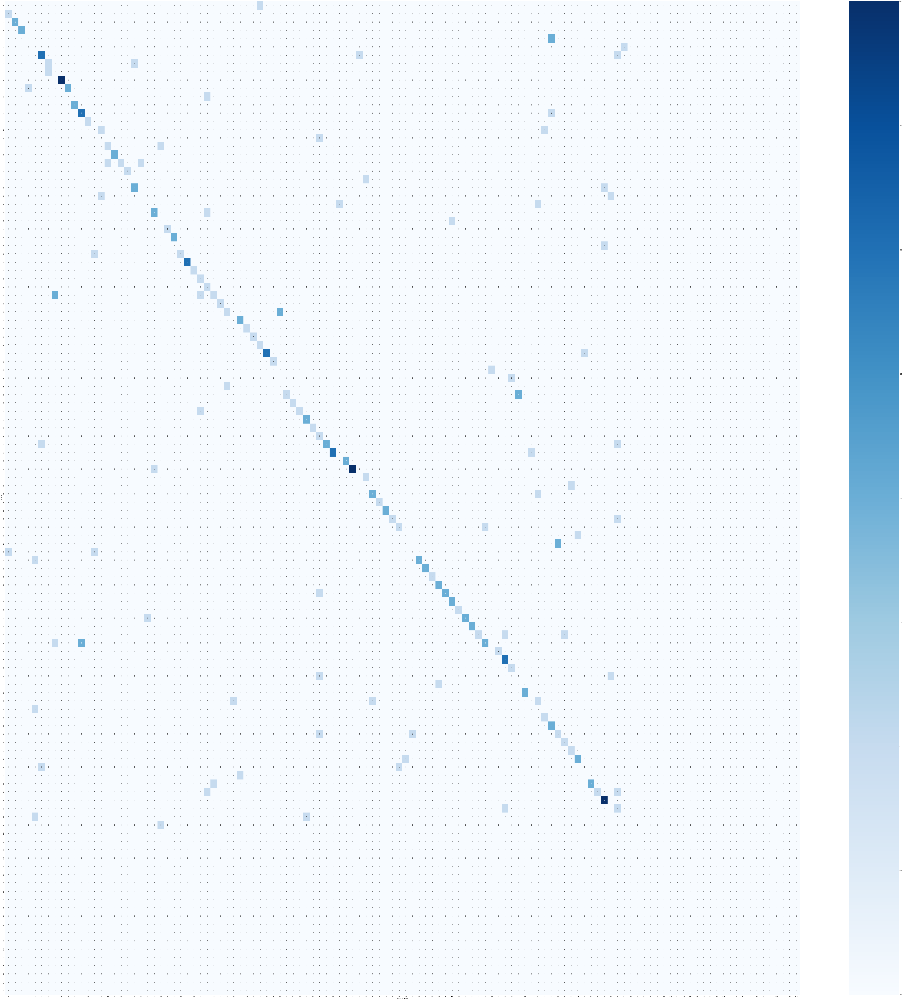

In [77]:
import seaborn as sns
figure = plt.figure(figsize=(100, 100))
sns.heatmap(confusion, annot=True,cmap=plt.cm.Blues)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

## 7. Saving and loading the model

In [38]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [79]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220727-13191658927971-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220727-13191658927971-1000-images-mobilenetv2-Adam.h5'

In [19]:
# Create a function to load a saved model
def load_model(model_path):
    """
    loads a saved model from give path
    """
    print(f"Loading Model: {model_path}")
    model = tf.keras.models.load_model(model_path,
                                 custom_objects = {"KerasLayer":hub.KerasLayer})
    return model

We've function to save and load model, now check their working

In [85]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20220727-13191658927971-1000-images-mobilenetv2-Adam.h5")

Loading Model: drive/MyDrive/Dog Vision/models/20220727-13191658927971-1000-images-mobilenetv2-Adam.h5


In [88]:
# Evaluate the loaded model
model.evaluate(valid_data)

7/7 [==============================] - 1s 105ms/step - loss: 1.2935 - accuracy: 0.6100


[1.2934874296188354, 0.6100000143051147]

In [89]:
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 2s 132ms/step - loss: 1.2935 - accuracy: 0.6100


[1.2934874296188354, 0.6100000143051147]

## 8. Training a big model on full data.

In [91]:
len(X), len(y)

(10222, 10222)

In [92]:
X[:10]

['drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [93]:
y[:10]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [94]:
# Create a data batch  with full data set.
full_data = create_data_batches(X,y)

Creating Training Data Batches


In [95]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [97]:
# Create a model for full data

full_model = create_model()

Building Model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [98]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No valid data for full data
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                            patience = 3)
 

**NOTE** Running the cell below will take upto approx 30 mins for first epoch bcz GPU has to load all 10222 images.

In [100]:
# Fit the model to full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 41s 117ms/step - loss: 1.3311 - accuracy: 0.6717
Epoch 2/100
320/320 [==============================] - 35s 110ms/step - loss: 0.3937 - accuracy: 0.8851
Epoch 3/100
320/320 [==============================] - 36s 112ms/step - loss: 0.2369 - accuracy: 0.9349
Epoch 4/100
320/320 [==============================] - 39s 120ms/step - loss: 0.1523 - accuracy: 0.9642
Epoch 5/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1057 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0753 - accuracy: 0.9875
Epoch 7/100
320/320 [==============================] - 35s 108ms/step - loss: 0.0574 - accuracy: 0.9916
Epoch 8/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0467 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0367 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 35s 108m

In [101]:
save_model(full_model, suffix="full-data-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220727-13531658930035-full-data-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220727-13531658930035-full-data-mobilenetv2-Adam.h5'

In [40]:
# Loading saved full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20220727-13531658930035-full-data-mobilenetv2-Adam.h5')

Loading Model: drive/MyDrive/Dog Vision/models/20220727-13531658930035-full-data-mobilenetv2-Adam.h5


## Testing our model

Since we have trained the full model, now we've to test the model.
To make predictions on `test_data` we'll do:
1. Get the test image filenames.
2. Convert images into data batches and tenors using `create_data_bataches` function.
3. Making predictions array by passing test batches to `predict` function.


In [13]:
# Load test image filenames
import os
test_path = "drive/MyDrive/Dog-vision/test/"
test_filenames= [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-vision/test/e2888231cedd08540816e629c0733922.jpg',
 'drive/MyDrive/Dog-vision/test/e26901a9e04f0ba89765fb9b9b7f675f.jpg',
 'drive/MyDrive/Dog-vision/test/e1967a2e9c507c256b83a1e2e4f4e941.jpg',
 'drive/MyDrive/Dog-vision/test/e6326f6c8ad1e06c0f70546ddfc64067.jpg',
 'drive/MyDrive/Dog-vision/test/e0e3eb01e80b1d694a47b23909e158ec.jpg',
 'drive/MyDrive/Dog-vision/test/df577444ba8b7733f42c49e9d42111a9.jpg',
 'drive/MyDrive/Dog-vision/test/df0196ea5d16d1570c1f2b567b975b90.jpg',
 'drive/MyDrive/Dog-vision/test/e12e6997c15c233c7b92209e08ff9d14.jpg',
 'drive/MyDrive/Dog-vision/test/ddfbebe13aa8fba30f347c58466215df.jpg',
 'drive/MyDrive/Dog-vision/test/df2a003a0b1a216effd806f03f703859.jpg']

In [111]:
len(test_filenames)

10357

In [42]:
# Create Test data batch
test_data = create_data_batches(test_filenames,test_data = True)

Creating Test Data Batches.


In [113]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Running cell below will take fairly long time due to large data

In [43]:
# Make Predictions on test data batches using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 238s 662ms/step


In [44]:
# Save predictions to CSV
np.savetxt("drive/MyDrive/Dog Vision/predictions.csv",test_predictions,delimiter = ",")

In [6]:
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/predictions.csv", delimiter=",")

In [47]:
test_predictions[:10]

array([[1.85722087e-08, 3.53663012e-07, 1.28018018e-09, ...,
        4.36725912e-07, 2.79481552e-04, 3.21791704e-10],
       [1.01472878e-07, 6.48043641e-12, 2.91643976e-09, ...,
        8.66462111e-01, 7.19958280e-06, 6.87797874e-10],
       [7.70849981e-11, 1.15643823e-12, 1.41730183e-10, ...,
        2.21725955e-07, 6.45078990e-10, 1.68715562e-11],
       ...,
       [1.12694787e-09, 2.05776218e-09, 4.02430811e-10, ...,
        6.46030673e-10, 4.54283295e-08, 2.61558773e-04],
       [2.86144285e-12, 1.05783375e-10, 9.33876500e-12, ...,
        3.43013326e-11, 1.37449108e-09, 2.15039697e-09],
       [2.07375280e-11, 1.43226798e-05, 1.81568649e-11, ...,
        4.48092785e-10, 8.47108408e-12, 8.44296855e-12]])

In [48]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle.
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

1. Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
2. Add data to the ID column by extracting the test image ID's from their filepaths.
3. Add data (the prediction probabilites) to each of the dog breed columns.
4. Export the DataFrame as a CSV to submit it to Kaggle.

In [5]:
preds_df = pd.DataFrame(columns=['id']+list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [17]:
ids = [path.replace("drive/MyDrive/Dog-vision/test/","").replace(".jpg","") for path in test_filenames]

In [18]:
ids[:10]

['e2888231cedd08540816e629c0733922',
 'e26901a9e04f0ba89765fb9b9b7f675f',
 'e1967a2e9c507c256b83a1e2e4f4e941',
 'e6326f6c8ad1e06c0f70546ddfc64067',
 'e0e3eb01e80b1d694a47b23909e158ec',
 'df577444ba8b7733f42c49e9d42111a9',
 'df0196ea5d16d1570c1f2b567b975b90',
 'e12e6997c15c233c7b92209e08ff9d14',
 'ddfbebe13aa8fba30f347c58466215df',
 'df2a003a0b1a216effd806f03f703859']

In [19]:
preds_df['id'] = ids

In [20]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2888231cedd08540816e629c0733922,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e26901a9e04f0ba89765fb9b9b7f675f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e1967a2e9c507c256b83a1e2e4f4e941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6326f6c8ad1e06c0f70546ddfc64067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0e3eb01e80b1d694a47b23909e158ec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2888231cedd08540816e629c0733922,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e26901a9e04f0ba89765fb9b9b7f675f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e1967a2e9c507c256b83a1e2e4f4e941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6326f6c8ad1e06c0f70546ddfc64067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0e3eb01e80b1d694a47b23909e158ec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2888231cedd08540816e629c0733922,1.857221e-08,3.536630e-07,1.280180e-09,4.780850e-05,1.406855e-06,5.174915e-07,7.691711e-07,1.383130e-06,8.866575e-01,...,3.382860e-07,4.475262e-07,6.600238e-06,5.983109e-02,2.441666e-07,1.050226e-06,8.646464e-07,4.367259e-07,2.794816e-04,3.217917e-10
1,e26901a9e04f0ba89765fb9b9b7f675f,1.014729e-07,6.480436e-12,2.916440e-09,5.656761e-11,1.474405e-08,1.910431e-09,2.298496e-11,9.456907e-06,7.647837e-10,...,4.577932e-09,2.268391e-08,2.926274e-09,3.854425e-07,6.660573e-09,8.638307e-11,1.821717e-07,8.664621e-01,7.199583e-06,6.877979e-10
2,e1967a2e9c507c256b83a1e2e4f4e941,7.708500e-11,1.156438e-12,1.417302e-10,1.307380e-09,5.161769e-06,3.041652e-09,7.822666e-11,1.465883e-10,1.861684e-07,...,1.211893e-08,6.527001e-11,9.627123e-01,2.158038e-06,1.517640e-06,7.734761e-11,3.635344e-12,2.217260e-07,6.450790e-10,1.687156e-11
3,e6326f6c8ad1e06c0f70546ddfc64067,2.358694e-09,2.256897e-04,2.753200e-09,6.783524e-06,1.131919e-09,2.212533e-08,5.100975e-04,1.559160e-05,3.155500e-07,...,1.401264e-07,1.132135e-05,3.472220e-06,8.774088e-02,1.192539e-06,4.317176e-07,1.322012e-06,8.472455e-03,1.485848e-02,1.184192e-06
4,e0e3eb01e80b1d694a47b23909e158ec,1.030041e-09,5.749896e-06,1.314862e-09,6.844779e-11,9.382067e-10,4.870456e-09,5.548987e-10,9.817386e-10,6.597568e-11,...,5.294131e-07,2.205102e-09,1.244681e-10,5.076436e-09,1.570266e-07,1.194064e-10,2.901309e-11,8.101364e-08,5.845771e-10,1.178425e-10


In [24]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images.
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the * test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.




In [14]:
custom_path = "drive/MyDrive/Dog Vision/Custom_Images/"
custom_filenames= [custom_path + fname for fname in os.listdir(custom_path)]

In [15]:
custom_filenames

['drive/MyDrive/Dog Vision/Custom_Images/Bulldog.jpg',
 'drive/MyDrive/Dog Vision/Custom_Images/Yorkshire Terrier.jpg',
 'drive/MyDrive/Dog Vision/Custom_Images/Labrador Retrievers.jpg',
 'drive/MyDrive/Dog Vision/Custom_Images/German Shepherds.jpg',
 'drive/MyDrive/Dog Vision/Custom_Images/Gloden Retrievers.jpg']

In [18]:
# Create Custom data batch
custom_data = create_data_batches(custom_filenames,test_data = True)

Creating Test Data Batches.


In [22]:
# Loading saved full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20220727-13531658930035-full-data-mobilenetv2-Adam.h5')

Loading Model: drive/MyDrive/Dog Vision/models/20220727-13531658930035-full-data-mobilenetv2-Adam.h5


In [23]:
custom_predictions = loaded_full_model.predict(custom_data,
                                             verbose = 1)


1/1 [==============================] - 15s 15s/step


In [24]:
custom_predictions

array([[2.09060325e-09, 1.45915450e-11, 1.08865174e-11, 6.31291300e-07,
        1.33817390e-01, 5.82448623e-09, 9.09783694e-07, 1.69696079e-06,
        4.16710257e-08, 5.01909909e-08, 2.96168617e-10, 5.03340460e-11,
        1.74234793e-10, 1.64195786e-08, 6.82395873e-09, 3.45102363e-10,
        2.69136127e-08, 4.14249058e-07, 2.72707146e-09, 1.07041706e-04,
        4.10610674e-08, 8.23514700e-01, 1.56578352e-07, 1.53743274e-09,
        6.26627061e-09, 2.06388906e-02, 1.49706122e-10, 9.16644524e-07,
        3.63816777e-09, 2.51450943e-10, 2.81854209e-05, 3.25391028e-07,
        8.70766903e-10, 1.55097177e-06, 2.91589330e-09, 4.00110338e-07,
        6.92616728e-11, 4.55016957e-09, 1.35634295e-08, 1.44101335e-08,
        2.95686586e-10, 7.95965605e-09, 3.13016502e-09, 3.70945852e-12,
        1.30838271e-10, 4.46420700e-06, 1.73186656e-08, 2.12709558e-10,
        6.29687634e-07, 3.49195464e-11, 1.17935883e-10, 2.99514090e-06,
        9.10294773e-09, 5.64665394e-03, 2.48880672e-09, 1.384622

In [36]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_predictions[i]) for i in range(len(custom_predictions))]
custom_pred_labels

['boxer',
 'yorkshire_terrier',
 'labrador_retriever',
 'german_shepherd',
 'golden_retriever']

In [37]:
custom_filenames

['drive/MyDrive/Dog Vision/Custom_Images/Bulldog.jpg',
 'drive/MyDrive/Dog Vision/Custom_Images/Yorkshire Terrier.jpg',
 'drive/MyDrive/Dog Vision/Custom_Images/Labrador Retrievers.jpg',
 'drive/MyDrive/Dog Vision/Custom_Images/German Shepherds.jpg',
 'drive/MyDrive/Dog Vision/Custom_Images/Gloden Retrievers.jpg']

In [43]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

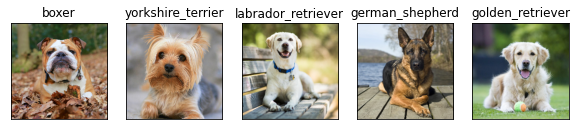

In [45]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)